### Initial run

Initial end to end test, a sort of a "teaser" to highlight the motivation for `concurrent_dataloader`. 

In [67]:
from benchmarking.analysis.analyze_results import *

In [68]:
output_base_folder = Path("/iarai/home/ivan.svogor/storage-benchmarking/benchmark_output/motivation/last_run")

In [69]:
s3_folder_filter="*s3*"
scratch_folder_filter="*scratch*"

Load the data

In [71]:
# df_dataloader_s3 = extract_timelines(output_base_folder, folder_filter=s3_folder_filter)
df_dataloader_scratch = extract_timelines(output_base_folder, folder_filter=scratch_folder_filter)


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:00<00:00, 185.34it/s]


Create "colors" and "lanes". Colors are used to distinguish different function types, e.g. function that loads a batch, calls the `next_data`, `run_traning_batch` from Lightning and `training_batch_to_device` also from lightning.
Lanes, every single call of the aforementioned funcitons in their own respective lane, so we get a nice overview of when the function is called, and how long it tookl

Extract the GPU Utilization data

In [5]:
df_gpuutil_s3 = extract_gpuutil(output_base_folder, folder_filter=s3_folder_filter, ms=True, skip=8)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 111/111 [00:52<00:00,  2.13it/s]


In [72]:
df_gpuutil_scratch = extract_gpuutil(output_base_folder, folder_filter=scratch_folder_filter, ms=True, skip=8)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:00<00:00, 29.30it/s]


### Plot function timelines for remote storage (AWS S3)

In [73]:
unique_runs_s3, unique_functions, colors, lanes = get_colors_runs_and_lanes(df_dataloader_s3)
print(unique_functions)

['advance', 'next_data', 'postrun_training_batch', 'prep_training_batch', 'prerun', 'reset_timeline', 'batch', 'training_batch_to_device', 'run_training_batch']


timestamp_2 True
72.72841091492776 42.63017447827574


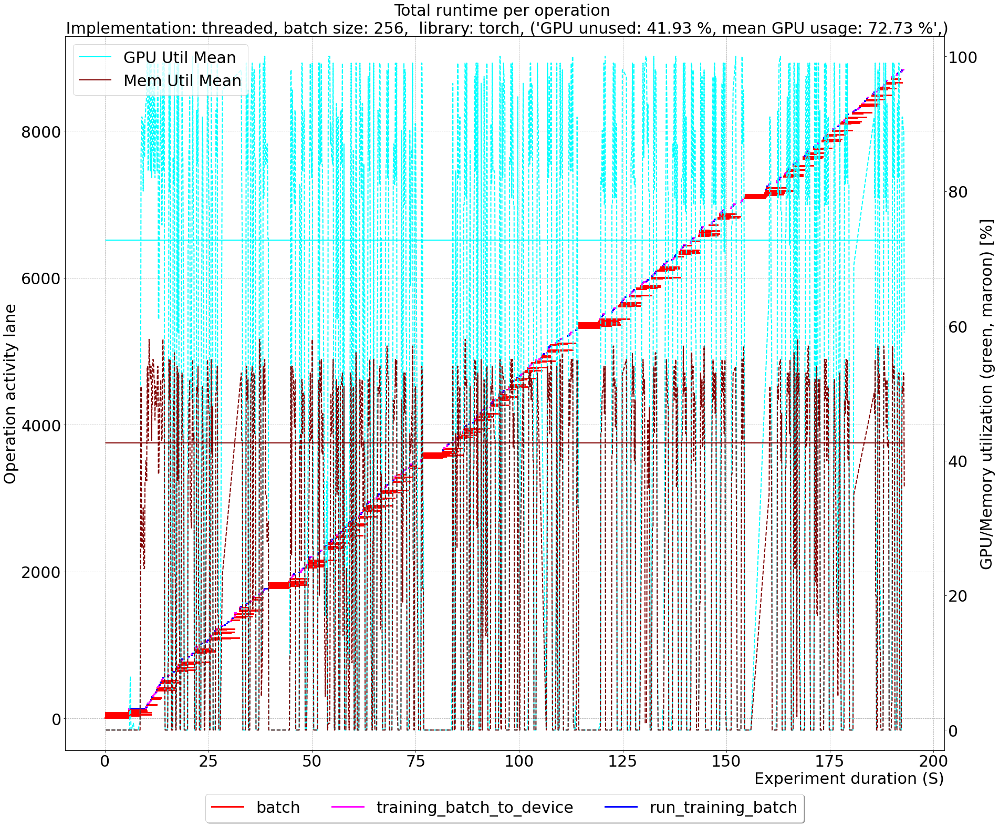

timestamp_2 True
76.09529612478674 21.131328707273195


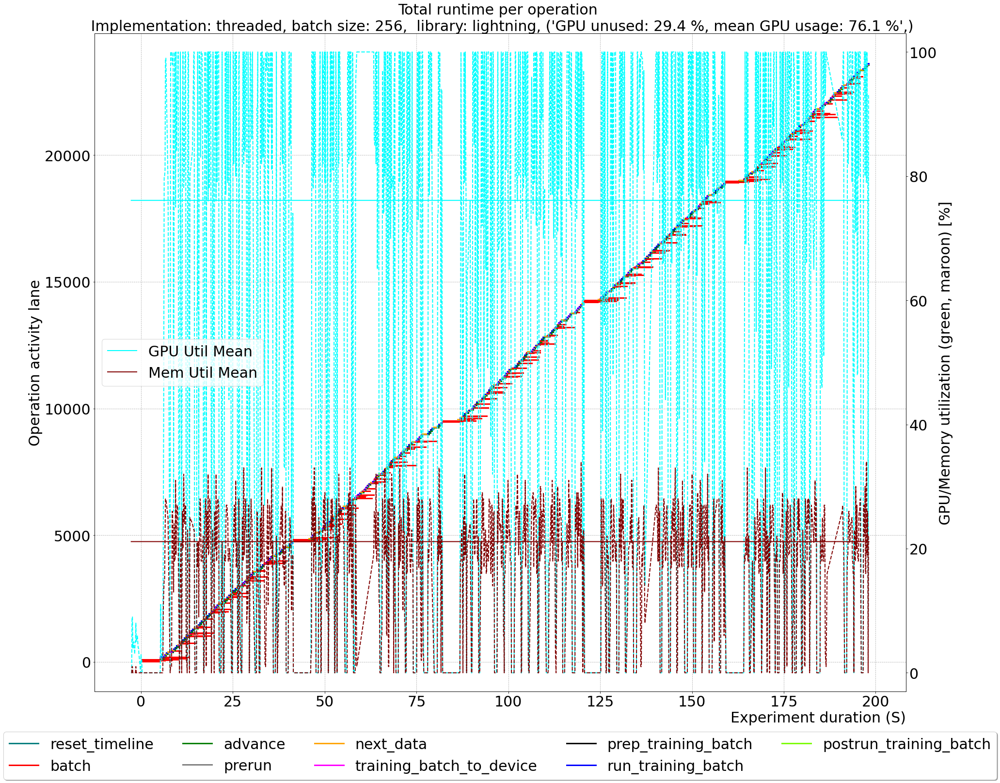

timestamp_2 True
76.00748941712797 41.63147208121828


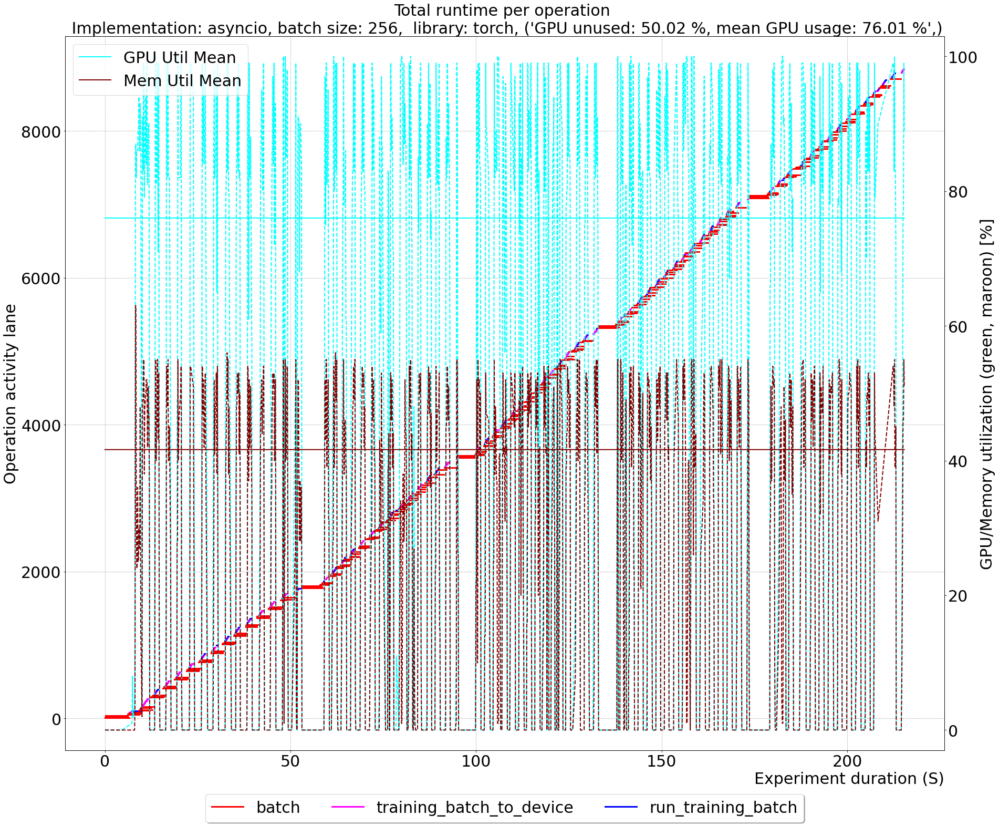

timestamp_2 True
78.59087582337155 21.600305888350753


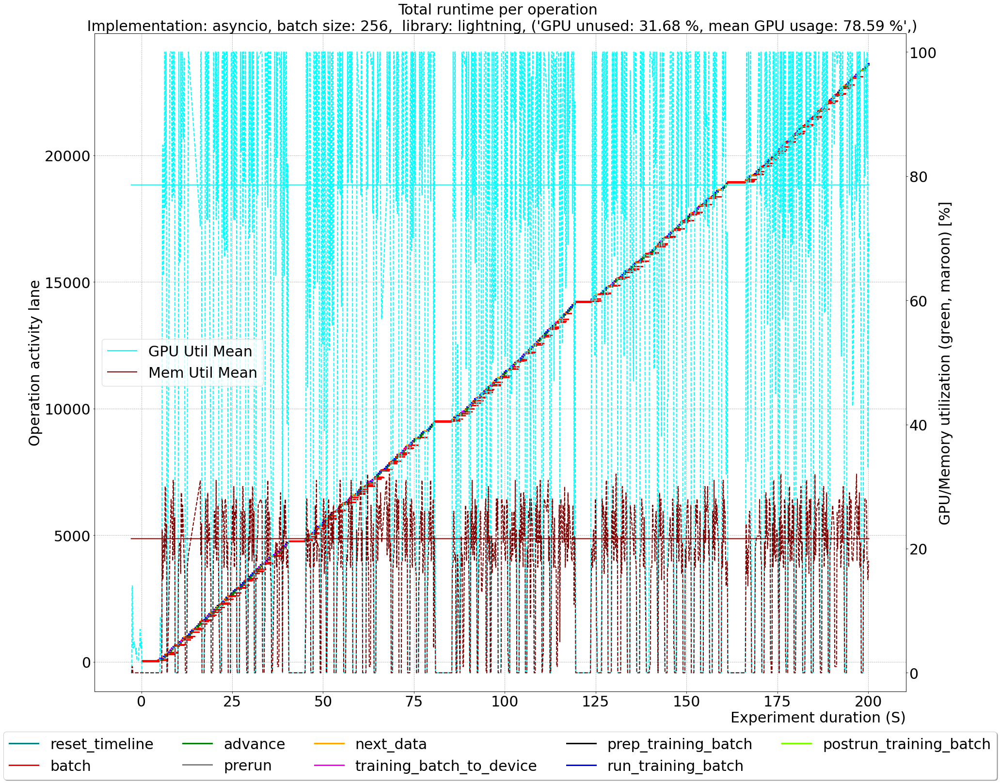

timestamp_2 True
72.85831960461284 42.973142657830486


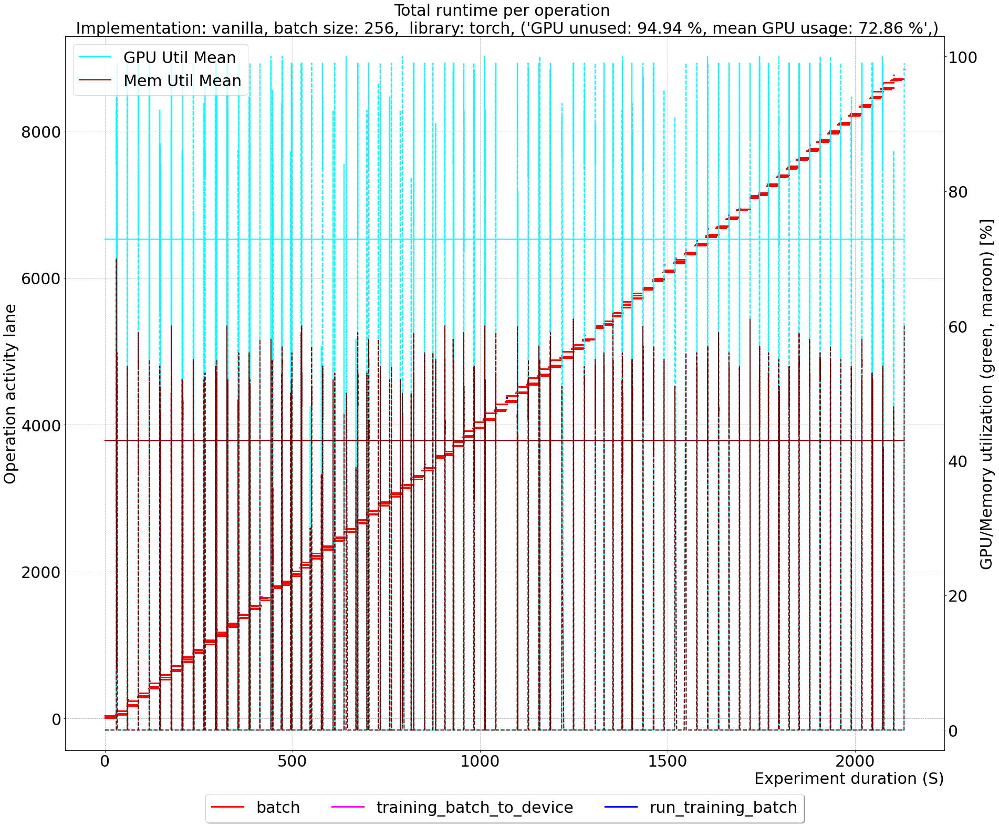

timestamp_2 True
64.34891216760677 18.924392439243924


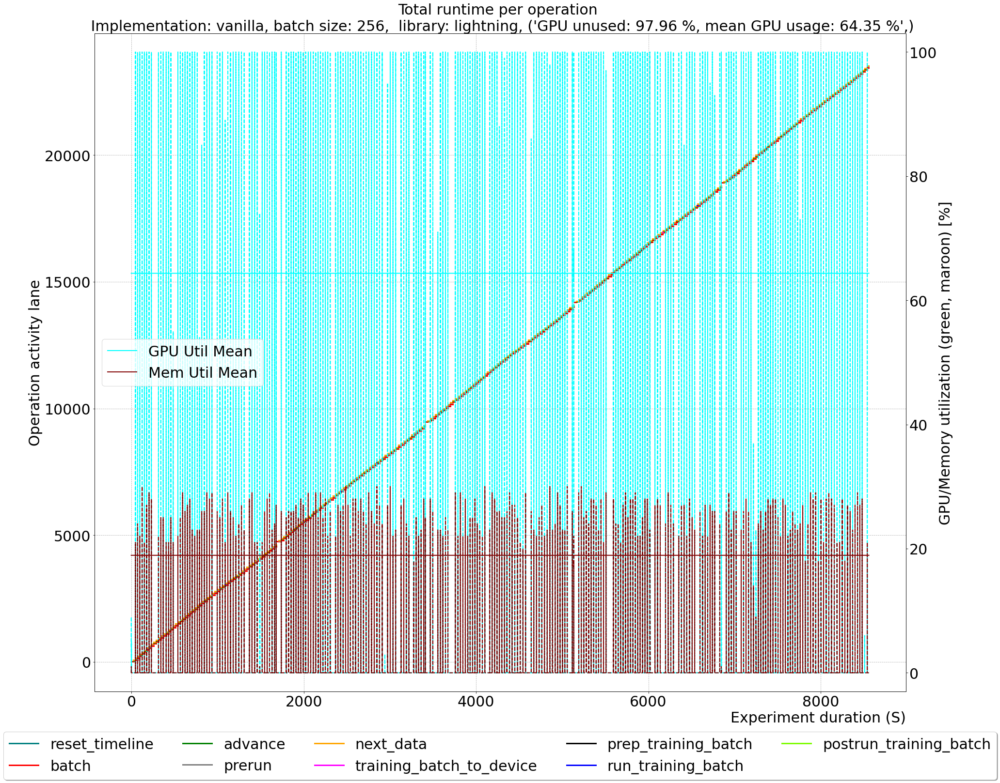

In [33]:
unique_runs_s3, unique_functions, colors, lanes = get_colors_runs_and_lanes(df_dataloader_s3)
returns_s3 = []

for run in sorted(unique_runs_s3):
    df = df_dataloader_s3[df_dataloader_s3["run"]==run]
    dfgpu = df_gpuutil_s3[df_gpuutil_s3["run"]==run]
    df = df.drop_duplicates(subset="id", keep="first", inplace=False) 
    result = show_timelines_with_gpu(df=df, gpu_util=dfgpu, lanes=lanes, colors=colors, run=run, 
                                     flat=False, show_gpu=True, zoom=False, zoom_epochs=2,
                                     skip_plot=False, ms=True)
    df = df_dataloader_s3[(df_dataloader_s3["item_x"]=="run_training_batch")&(df_dataloader_s3["run"]==run)].drop_duplicates(subset=['id'], keep="first", inplace=False) 
    result["duration_calc"] = (df["end_time_y"] - df["start_time_x"]).sum()
    df = df_dataloader_s3[(df_dataloader_s3["item_x"]=="training_batch_to_device")&(df_dataloader_s3["run"]==run)].drop_duplicates(subset=['id'], keep="first", inplace=False) 
    result["duration_transf"] = (df["end_time_y"] - df["start_time_x"]).sum()
    result["run"]=run
    returns_s3.append(result)

### Plot function timelines for local storage

timestamp_2 True


KeyError: 'reset_timeline'

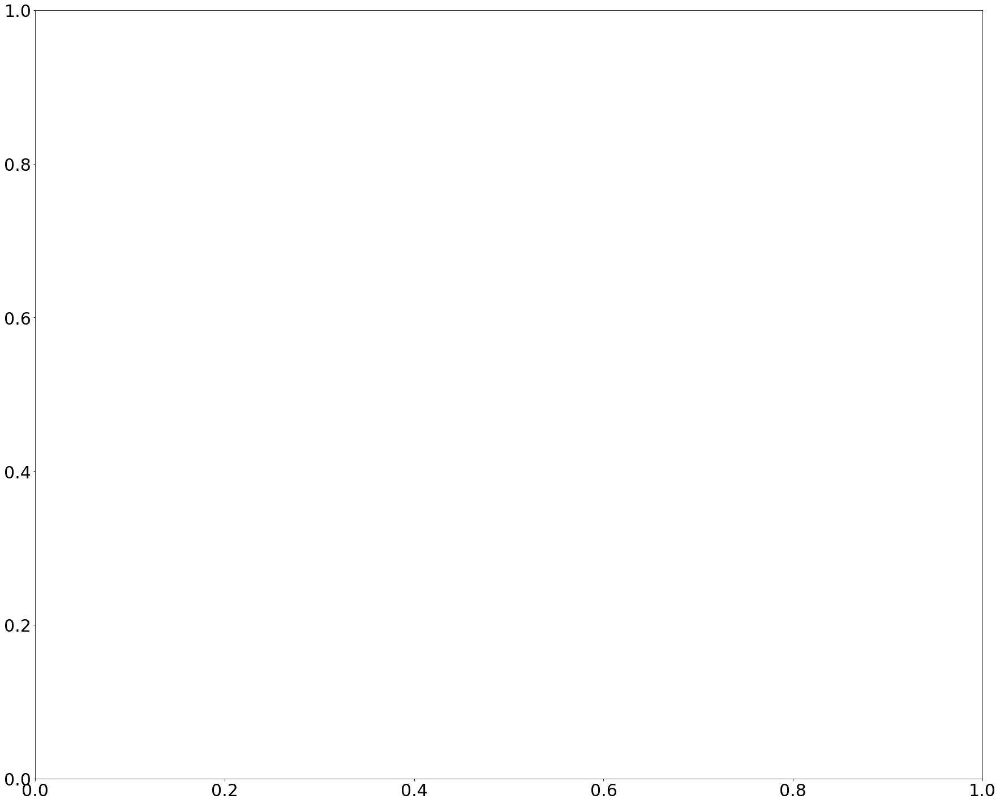

In [75]:
unique_runs_scratch, unique_functions, colors, lanes = get_colors_runs_and_lanes(df_dataloader_scratch)
returns_scratch = []

for run in sorted(unique_runs_scratch):
    df = df_dataloader_scratch[df_dataloader_scratch["run"]==run]
    dfgpu = df_gpuutil_scratch[df_gpuutil_scratch["run"]==run]
    df = df.drop_duplicates(subset="id", keep="first", inplace=False)
    result = show_timelines_with_gpu(df=df, gpu_util=dfgpu, lanes=lanes, colors=colors, run=run, 
                                     flat=False, show_gpu=True, zoom=False, zoom_epochs=2,
                                     skip_plot=False, ms=True)
    df = df_dataloader_scratch[(df_dataloader_scratch["item_x"]=="run_training_batch")&(df_dataloader_scratch["run"]==run)].drop_duplicates(subset=['id'], keep="first", inplace=False) 
    result["duration_calc"] = (df["end_time_y"] - df["start_time_x"]).sum()
    df = df_dataloader_scratch[(df_dataloader_scratch["item_x"]=="training_batch_to_device")&(df_dataloader_scratch["run"]==run)].drop_duplicates(subset=['id'], keep="first", inplace=False) 
    result["duration_transf"] = (df["end_time_y"] - df["start_time_x"]).sum()
    result["run"]=run
    returns_scratch.append(result)

Get unique runs to loop through, and plot the results

### Result tables
Print throughput in loaded images per second, and function duration in seconds, for S3 and Scratch

In [35]:
# sanity check
get_metadata_info(output_base_folder / "" / unique_runs_s3[0])

Dataset:  15000
Batch size: 256
Epochs:  5
Images total:  75000
Batches per epoch 59
Images total (rounded):  75520


(15000, 256, 5, 75000, 59, 75520)

In [36]:
df_full_s3 = extract_pandas(output_base_folder, folder_filter=s3_folder_filter)
results_s3 = pd.DataFrame.from_records(data=returns_s3)
r_s3 = get_throughput(results_s3, "", df_full_s3, unique_runs_s3, output_base_folder)
r_s3.round(2)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 111/111 [00:09<00:00, 11.53it/s]


,runtime,gpu_util_zero,gpu_util_mean_no_zeros,mem_util_mean,mem_util_mean_no_zeros,implementation,cache,library,fig,duration_calc,duration_transf,throughput,dl_MB,imgs,Mbit/s,MB/s
0,192.78,41.93,72.73,23.23,42.63,threaded,1,torch,Figure(2160x1800),28.00,34.63,389.05,8035.28,75000,333.46,41.68
1,198.10,29.40,76.10,14.15,21.13,threaded,1,lightning,Figure(2160x1800),104.05,14.63,378.59,7802.14,75000,315.07,39.38
2,215.28,50.02,76.01,20.02,41.63,asyncio,1,torch,Figure(2160x1800),25.95,39.29,348.38,8464.63,75000,314.55,39.32
3,200.10,31.68,78.59,14.12,21.60,asyncio,1,lightning,Figure(2160x1800),103.75,12.87,374.82,8464.63,75000,338.42,42.30
4,2131.57,94.94,72.86,2.05,42.97,vanilla,1,torch,Figure(2160x1800),27.24,38.32,35.19,8464.63,75000,31.77,3.97
5,8558.15,97.96,64.35,0.35,18.92,vanilla,1,lightning,Figure(2160x1800),106.85,17.30,8.76,8464.63,75000,7.91,0.99


In [37]:
df_full_scratch = extract_pandas(output_base_folder, folder_filter=scratch_folder_filter)
results_scratch = pd.DataFrame.from_records(data=returns_scratch)
r_scratch = get_throughput(results_scratch, "", df_full_scratch, unique_runs_scratch, output_base_folder)
r_scratch.round(2)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 111/111 [00:11<00:00,  9.38it/s]


,runtime,gpu_util_zero,gpu_util_mean_no_zeros,mem_util_mean,mem_util_mean_no_zeros,implementation,cache,library,fig,duration_calc,duration_transf,throughput,dl_MB,imgs,Mbit/s,MB/s
0,90.30,5.82,90.28,45.54,48.94,threaded,1,torch,Figure(2160x1800),26.07,47.52,830.61,9266.80,75000,821.02,102.63
1,130.03,3.82,84.13,21.71,23.13,threaded,1,lightning,Figure(2160x1800),103.97,14.54,576.78,9301.72,75000,572.27,71.53
2,92.38,4.99,88.25,44.26,47.04,asyncio,1,torch,Figure(2160x1800),25.24,49.84,811.87,8456.77,75000,732.35,91.54
3,130.00,2.72,84.41,21.75,23.12,asyncio,1,lightning,Figure(2160x1800),103.76,14.59,576.91,8456.77,75000,520.40,65.05
4,137.34,28.15,78.12,30.03,43.23,vanilla,1,torch,Figure(2160x1800),25.93,36.45,546.09,8456.77,75000,492.61,61.58
5,492.84,65.94,64.48,5.69,18.52,vanilla,1,lightning,Figure(2160x1800),103.72,16.26,152.18,8456.77,75000,137.27,17.16


In [38]:
# LaTeX style
# matplotlib.rcParams['mathtext.fontset'] = 'stix'
# matplotlib.rcParams['font.family'] = 'STIXGeneral'
# matplotlib.pyplot.title(r'ABC123 vs $\mathrm{ABC123}^{123}$')

# matplotlib.rcParams.update(matplotlib.rcParamsDefault)

In [39]:
torch_s3 = r_s3[r_s3["library"]=="torch"]
lightning_s3 = r_s3[r_s3["library"]=="lightning"]

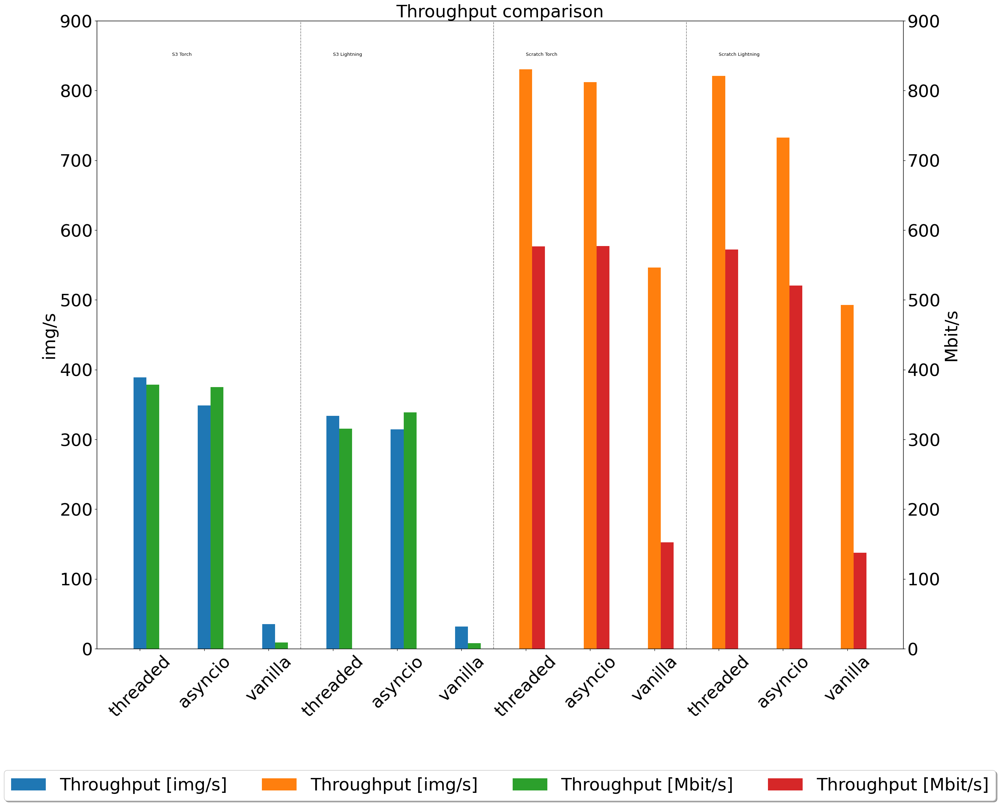

In [40]:
matplotlib.rcParams.update({'font.size': 8})
fig, ax = plt.subplots(dpi=120)
offset = 0
offset2 = 3

sc_offset = 6
sc_offset2 = 9

width = 0.2
labels = ['threaded', 'asyncio', 'vanilla', 'threaded', 'asyncio', 'vanilla'] * 2


ax2 = ax.twinx()
for lib, lab in zip(["torch", "lightning"], ["Throughput [img/s]", "Throughput [Mbit/s]"]):
    curr = r_s3[r_s3["library"]==lib]["throughput"]
    ax.bar(height=curr, x=np.arange(len(curr))+offset, width=width, label=lab)
    offset += 0.2
    curr = r_s3[r_s3["library"]==lib]["Mbit/s"]
    ax2.bar(height=curr, x=np.arange(len(curr))+offset2, width=width)
    offset2 += 0.2
    
    curr = r_scratch[r_scratch["library"]==lib]["throughput"]
    ax.bar(height=curr, x=np.arange(len(curr))+sc_offset, width=width, label=lab)
    sc_offset += 0.2
    curr = r_scratch[r_scratch["library"]==lib]["Mbit/s"]
    ax2.bar(height=curr, x=np.arange(len(curr))+sc_offset2, width=width)
    sc_offset2 += 0.2
    
ax.text(0.5, 850, "S3 Torch")
ax.text(3.0, 850, "S3 Lightning")
ax.text(6.0, 850, "Scratch Torch")
ax.text(9.0, 850, "Scratch Lightning")


ax.set_ylabel("img/s")
ax2.set_ylabel("Mbit/s")
    
ax.set_ylim([0, 900])
ax2.set_ylim([0, 900])
# ax.grid(linestyle="--", which="both")

ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.18),
          fancybox=True, shadow=True, ncol=5)

ax.set_xticks(np.arange(len(r_s3)*2), labels, rotation="45")
ax.set_title("Throughput comparison")
plt.axvline(x=2.5, color="gray", linestyle="--", linewidth=1)
plt.axvline(x=5.5, color="gray", linestyle="--", linewidth=1)
plt.axvline(x=8.5, color="gray", linestyle="--", linewidth=1)


In [16]:
!pip install latex

In [60]:
font_size=30
params = {'legend.fontsize': font_size,
          'figure.figsize': (25, 15),
          'axes.labelsize': font_size,
          'axes.titlesize': font_size,
          'xtick.labelsize': font_size,
          'ytick.labelsize': font_size}

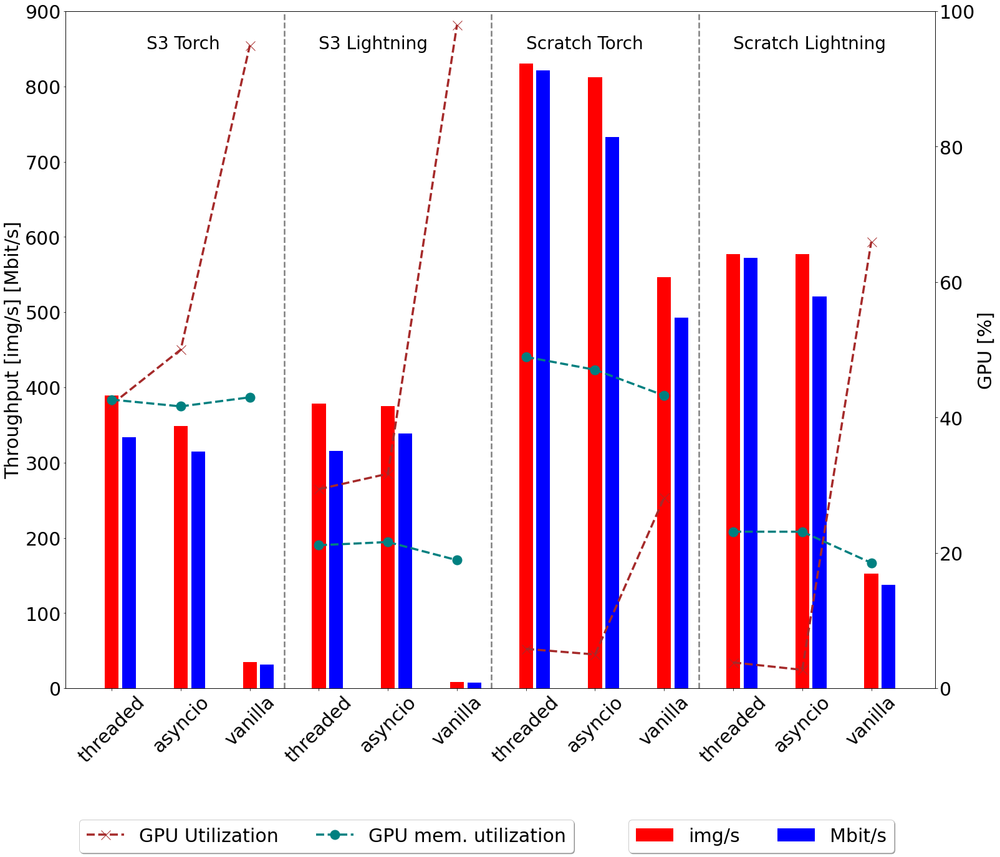

In [42]:

# plt.rcParams.update({
#   "text.usetex": True,
#   "font.family": "Helvetica"
# })
plt.rcParams.update(params)
# matplotlib.rcParams.update({'font.size': 8})
fig, ax = plt.subplots()
offset = 0
offset2 = 6
gpu_offset = 0
gpu_offset2 = 0

width = 0.2
labels = ['threaded', 'asyncio', 'vanilla', 'threaded', 'asyncio', 'vanilla'] * 2


ax2 = ax.twinx()
for lib, lab in zip(["torch", "lightning"], ["Throughput [img/s]", "Throughput [Mbit/s]"]):
    # S3
    curr = r_s3[r_s3["library"]==lib]["throughput"]
    ax.bar(height=curr, x=[i + offset for i in range(3)], width=width, label="img/s", color="red")
    curr = r_s3[r_s3["library"]==lib]["Mbit/s"]
    ax.bar(height=curr, x=[i + offset + 0.25 for i in range(3)], width=width, label="Mbit/s", color="blue")
    offset += 3
    # Scratch
    curr = r_scratch[r_scratch["library"]==lib]["throughput"]
    ax.bar(height=curr, x=[i + offset2 for i in range(3)], width=width, label="img/s", color="red")
    curr = r_scratch[r_scratch["library"]==lib]["Mbit/s"]
    ax.bar(height=curr, x=[i + offset2 + 0.25 for i in range(3)], width=width, label="Mbit/s", color="blue")
    offset2 += 3
    # GPU Util
    ax2.plot([i + gpu_offset for i in range(3)], r_s3[r_s3["library"]==lib]["gpu_util_zero"],
             marker = 'x', markersize = 15, color="brown", linestyle="--", linewidth=3.5, label="GPU Utilization")
    ax2.plot([i + gpu_offset for i in range(6, 9)], r_scratch[r_scratch["library"]==lib]["gpu_util_zero"],
         marker = 'x', markersize = 15, color="brown", linestyle="--", linewidth=3.5, label="GPU Utilization")
    gpu_offset += 3
    
    # GPU Unused
    ax2.plot([i + gpu_offset2 for i in range(3)], r_s3[r_s3["library"]==lib]["mem_util_mean_no_zeros"],
             marker = 'o', markersize = 15, color="teal", linestyle="--", linewidth=3.5, label="GPU mem. utilization")
    ax2.plot([i + gpu_offset2 for i in range(6, 9)], r_scratch[r_scratch["library"]==lib]["mem_util_mean_no_zeros"],
         marker = 'o', markersize = 15, color="teal", linestyle="--", linewidth=3.5, label="GPU mem. utilization")
    gpu_offset2 += 3
    
ax.text(0.5, 850, "S3 Torch", fontsize=28)
ax.text(3.0, 850, "S3 Lightning", fontsize=28)
ax.text(6.0, 850, "Scratch Torch", fontsize=28)
ax.text(9.0, 850, "Scratch Lightning", fontsize=28)


ax.set_ylabel("Throughput [img/s] [Mbit/s]")
ax2.set_ylabel("GPU [%]")
    
ax.set_ylim([0, 900])
ax2.set_ylim([0, 100])

ax.legend()
ax2.legend()


ax.set_xticks(np.arange(len(r_s3)*2), labels, rotation="45")
# ax.set_title("Implementation and library comparison, throughput and GPU utilization")
plt.axvline(x=2.5, color="gray", linestyle="--", linewidth=2.5)
plt.axvline(x=5.5, color="gray", linestyle="--", linewidth=2.5)
plt.axvline(x=8.5, color="gray", linestyle="--", linewidth=2.5)

handles, labels = ax2.get_legend_handles_labels()
by_label = dict(zip(labels, handles))
ax2.legend(by_label.values(), by_label.keys(), loc='upper center', bbox_to_anchor=(0.3, -0.18),
          fancybox=True, shadow=True, ncol=2)

handles, labels = ax.get_legend_handles_labels()
by_label = dict(zip(labels, handles))
ax.legend(by_label.values(), by_label.keys(), loc='upper center', bbox_to_anchor=(0.8, -0.18),
          fancybox=True, shadow=True, ncol=2)

fig.savefig(f"final_measurements.pdf", bbox_inches='tight')

# new

In [62]:
r_scratch["gpu_tp_both"] = (r_scratch["dl_MB"] * 8) / (r_scratch["duration_transf"] + r_scratch["duration_calc"])
r_scratch["gpu_tp"] = (r_scratch["dl_MB"] * 8) / r_scratch["duration_calc"] 
r_scratch["imgs_proc"] = (r_scratch["imgs"]) / r_scratch["duration_calc"]
r_scratch

,runtime,gpu_util_zero,gpu_util_mean_no_zeros,mem_util_mean,mem_util_mean_no_zeros,implementation,cache,library,fig,duration_calc,duration_transf,throughput,dl_MB,imgs,Mbit/s,MB/s,gpu_tp_both,gpu_tp,imgs_proc
0,90.295500,5.818620,90.280784,45.539727,48.937042,threaded,1,torch,Figure(2160x1800),26.074350,47.517995,830.606180,9266.799706,75000,821.019852,102.627481,1007.365622,2843.192589,2876.390055
1,130.031535,3.817365,84.134112,21.713573,23.127292,threaded,1,lightning,Figure(2160x1800),103.974880,14.543969,576.783161,9301.717835,75000,572.274583,71.534323,627.864206,715.689625,721.328076
2,92.378990,4.992260,88.246436,44.255418,47.040724,asyncio,1,torch,Figure(2160x1800),25.237369,49.839973,811.872919,8456.771183,75000,732.354507,91.544313,901.126324,2680.714010,2971.783592
3,130.003533,2.723029,84.407625,21.747666,23.120761,asyncio,1,lightning,Figure(2160x1800),103.762481,14.589493,576.907397,8456.771183,75000,520.402544,65.050318,571.635330,652.009946,722.804616
4,137.339435,28.154085,78.117308,30.032575,43.232601,vanilla,1,torch,Figure(2160x1800),25.934254,36.447342,546.092243,8456.771183,75000,492.605562,61.575695,1084.521284,2608.679949,2891.928136
5,492.837790,65.941110,64.482523,5.693435,18.524868,vanilla,1,lightning,Figure(2160x1800),103.723822,16.256445,152.179888,8456.771183,75000,137.274720,17.159340,563.877470,652.252958,723.074013


In [63]:
r_s3["gpu_tp_both"] = (r_s3["dl_MB"] * 8) / (r_s3["duration_transf"] + r_s3["duration_calc"])
r_s3["gpu_tp"] = (r_s3["dl_MB"] * 8) / r_s3["duration_calc"] 
r_s3["imgs_proc"] = (r_s3["imgs"]) / r_s3["duration_calc"]
r_s3

,runtime,gpu_util_zero,gpu_util_mean_no_zeros,mem_util_mean,mem_util_mean_no_zeros,implementation,cache,library,fig,duration_calc,duration_transf,throughput,dl_MB,imgs,Mbit/s,MB/s,gpu_tp_both,gpu_tp,imgs_proc
0,192.775922,41.927666,72.728411,23.230425,42.630174,threaded,1,torch,Figure(2160x1800),27.998663,34.627915,389.052737,8035.280130,75000,333.455758,41.681970,1026.437069,2295.903976,2678.699364
1,198.104993,29.404680,76.095296,14.146937,21.131329,threaded,1,lightning,Figure(2160x1800),104.049266,14.629385,378.587126,7802.144547,75000,315.071091,39.383886,525.934157,599.880794,720.812388
2,215.281296,50.016276,76.007489,20.022949,41.631472,asyncio,1,torch,Figure(2160x1800),25.953137,39.288333,348.381403,8464.628749,75000,314.551386,39.318923,1037.944572,2609.204003,2889.824026
3,200.095449,31.683333,78.590876,14.123000,21.600306,asyncio,1,lightning,Figure(2160x1800),103.752042,12.869790,374.821118,8464.628749,75000,338.423639,42.302955,580.654830,652.681420,722.877340
4,2131.568424,94.940655,72.858320,2.053811,42.973143,vanilla,1,torch,Figure(2160x1800),27.235532,38.322910,35.185359,8464.628749,75000,31.768640,3.971080,1032.926154,2486.348689,2753.755617
5,8558.149859,97.955081,64.348912,0.346450,18.924392,vanilla,1,lightning,Figure(2160x1800),106.852883,17.302337,8.763576,8464.628749,75000,7.912578,0.989072,545.422334,633.740785,701.899638


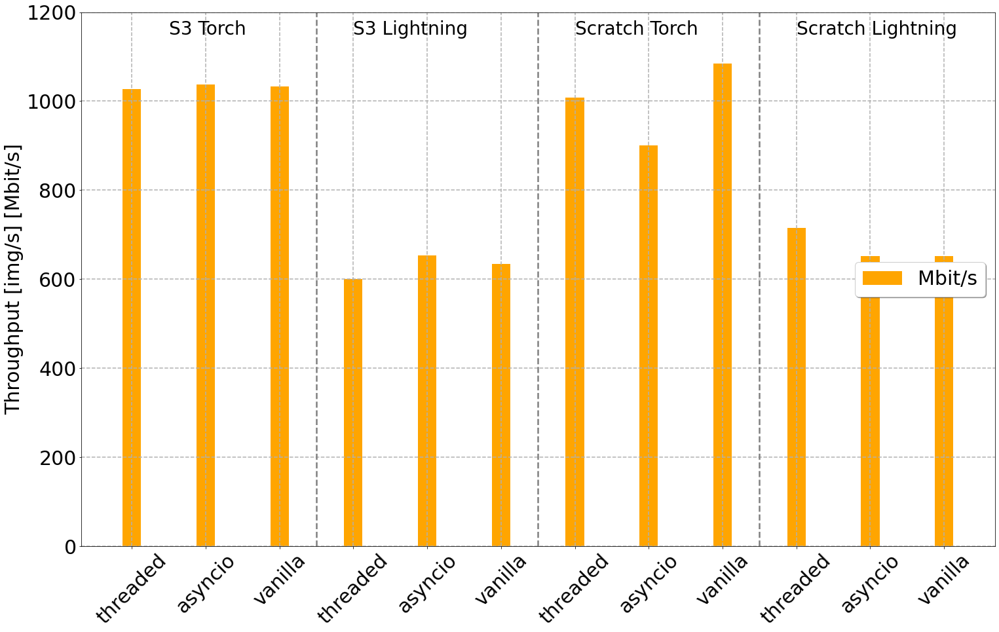

In [61]:

# plt.rcParams.update({
#   "text.usetex": True,
#   "font.family": "Helvetica"
# })
plt.rcParams.update(params)
# matplotlib.rcParams.update({'font.size': 8})
fig, ax = plt.subplots()
offset = 0
offset2 = 6
gpu_offset = 0
gpu_offset2 = 0

width = 0.25
labels = ['threaded', 'asyncio', 'vanilla', 'threaded', 'asyncio', 'vanilla'] * 2


# ax2 = ax.twinx()
for lib, lab in zip(["torch", "lightning"], ["Throughput [img/s]", "Throughput [Mbit/s]"]):
    # S3
    key = "gpu_tp" if lib == "lightning" else "gpu_tp_both"
    
    curr = r_s3[r_s3["library"]==lib][key]
    ax.bar(height=curr, x=[i + offset for i in range(3)], width=width, label="Mbit/s", color="orange")
    offset += 3
    # Scratch
    curr = r_scratch[r_scratch["library"]==lib][key]
    ax.bar(height=curr, x=[i + offset2 for i in range(3)], width=width, label="Mbit/s", color="orange")
    offset2 += 3

    
ax.text(0.5, 1150, "S3 Torch", fontsize=28)
ax.text(3.0, 1150, "S3 Lightning", fontsize=28)
ax.text(6.0, 1150, "Scratch Torch", fontsize=28)
ax.text(9.0, 1150, "Scratch Lightning", fontsize=28)


ax.grid(linestyle="--", which="both", linewidth=1.5)
ax.set_ylabel("Throughput [img/s] [Mbit/s]")
ax.set_ylim([0, 1200])
ax.legend()


ax.set_xticks(np.arange(len(r_s3)*2), labels, rotation="45")
# ax.set_title("Implementation and library comparison, throughput and GPU utilization")
plt.axvline(x=2.5, color="gray", linestyle="--", linewidth=2.5)
plt.axvline(x=5.5, color="gray", linestyle="--", linewidth=2.5)
plt.axvline(x=8.5, color="gray", linestyle="--", linewidth=2.5)

handles, labels = ax.get_legend_handles_labels()
by_label = dict(zip(labels, handles))
ax.legend(by_label.values(), by_label.keys(), loc='center right',
          fancybox=True, shadow=True, ncol=2)

# fig.savefig(f"gpu_throughput.pdf", bbox_inches='tight')

['advance', 'next_data', 'postrun_training_batch', 'prep_training_batch', 'prerun', 'reset_timeline', 'batch', 'training_batch_to_device', 'run_training_batch']
timestamp_2 True
84.13411154345006 23.127292054212067


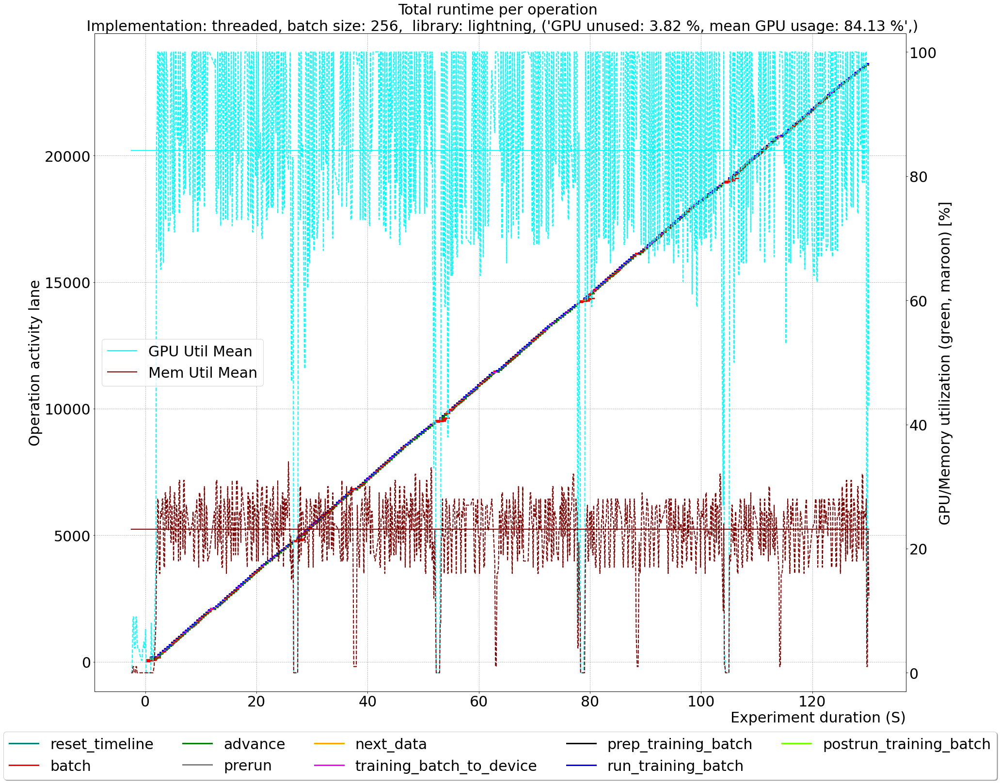

,item_x,id,start_time_x,item_y,end_time_y,source_file,run,duration_td
17,training_batch_to_device,1.516076e+18,1.645195e+09,training_batch_to_device,1.645195e+09,/iarai/home/ivan.svogor/storage-benchmarking/b...,20220218f153752_benchmark_e2e_lightning_scratc...,0.052612
26,training_batch_to_device,6.465576e+18,1.645195e+09,training_batch_to_device,1.645195e+09,/iarai/home/ivan.svogor/storage-benchmarking/b...,20220218f153752_benchmark_e2e_lightning_scratc...,0.040576
35,training_batch_to_device,6.577476e+18,1.645195e+09,training_batch_to_device,1.645195e+09,/iarai/home/ivan.svogor/storage-benchmarking/b...,20220218f153752_benchmark_e2e_lightning_scratc...,0.043735
45,training_batch_to_device,4.735905e+18,1.645195e+09,training_batch_to_device,1.645195e+09,/iarai/home/ivan.svogor/storage-benchmarking/b...,20220218f153752_benchmark_e2e_lightning_scratc...,0.040023
53,training_batch_to_device,6.435947e+18,1.645195e+09,training_batch_to_device,1.645195e+09,/iarai/home/ivan.svogor/storage-benchmarking/b...,20220218f153752_benchmark_e2e_lightning_scratc...,0.038910
62,training_batch_to_device,5.706021e+18,1.645195e+09,training_batch_to_device,1.645195e+09,/iarai/home/ivan.svogor/storage-benchmarking/b...,20220218f153752_benchmark_e2e_lightning_scratc...,0.042598
71,training_batch_to_device,5.469832e+17,1.645195e+09,training_batch_to_device,1.645195e+09,/iarai/home/ivan.svogor/storage-benchmarking/b...,20220218f153752_benchmark_e2e_lightning_scratc...,0.038912
80,training_batch_to_device,8.213703e+18,1.645195e+09,training_batch_to_device,1.645195e+09,/iarai/home/ivan.svogor/storage-benchmarking/b...,20220218f153752_benchmark_e2e_lightning_scratc...,0.042076
89,training_batch_to_device,1.573698e+18,1.645195e+09,training_batch_to_device,1.645195e+09,/iarai/home/ivan.svogor/storage-benchmarking/b...,20220218f153752_benchmark_e2e_lightning_scratc...,0.040785
98,training_batch_to_device,8.968183e+17,1.645195e+09,training_batch_to_device,1.645195e+09,/iarai/home/ivan.svogor/storage-benchmarking/b...,20220218f153752_benchmark_e2e_lightning_scratc...,0.039915


{'runtime': 130.03153538703918,
 'gpu_util_zero': 3.817365269461078,
 'gpu_util_mean_no_zeros': 84.13411154345006,
 'mem_util_mean': 21.713572854291417,
 'mem_util_mean_no_zeros': 23.127292054212067,
 'implementation': 'threaded',
 'cache': '1',
 'library': 'lightning',
 'fig': <Figure size 2160x1800 with 2 Axes>,
 'duration_tr': 103.9748797416687,
 'duration_b': 177.07077264785767,
 'duration_td': 14.543968677520752}

103.9748797416687
177.07077264785767
14.543968677520752


In [49]:
unique_runs_scratch, unique_functions, colors, lanes = get_colors_runs_and_lanes(df_dataloader_scratch)
print(unique_functions)
pd.set_option('display.max_rows', None)

rs = []

for run in sorted(unique_runs_scratch):
    if "lightning" in run:
        df = df_dataloader_scratch[df_dataloader_scratch["run"]==run]
        dfgpu = df_gpuutil_scratch[df_gpuutil_scratch["run"]==run]
        df = df.drop_duplicates(subset="id", keep="first", inplace=False)
        result = show_timelines_with_gpu(df=df, gpu_util=dfgpu, lanes=lanes, colors=colors, run=run, 
                                         flat=False, show_gpu=True, zoom=False, zoom_epochs=2,
                                         skip_plot=False, ms=True)
        df = df_dataloader_scratch[(df_dataloader_scratch["item_x"]=="run_training_batch") & (df_dataloader_scratch["run"]==run)].drop_duplicates(subset=['id'], keep="first", inplace=False) 
        df["duration_tr"] = df["end_time_y"] - df["start_time_x"]
        result["duration_tr"] = (df["end_time_y"] - df["start_time_x"]).sum()
        
        df = df_dataloader_scratch[(df_dataloader_scratch["item_x"]=="batch") & (df_dataloader_scratch["run"]==run)].drop_duplicates(subset=['id'], keep="first", inplace=False) 
        df["duration_b"] = df["end_time_y"] - df["start_time_x"]
        result["duration_b"] = (df["end_time_y"] - df["start_time_x"]).sum()
        
        df = df_dataloader_scratch[(df_dataloader_scratch["item_x"]=="training_batch_to_device") & (df_dataloader_scratch["run"]==run)].drop_duplicates(subset=['id'], keep="first", inplace=False) 
        df["duration_td"] = df["end_time_y"] - df["start_time_x"]
        result["duration_td"] = (df["end_time_y"] - df["start_time_x"]).sum()
    #     result["run"]=run
    #     rs.append(result)
        current_df = df[df["run"]==run]
        display(current_df)
        display(result)
        print(result["duration_tr"].sum())
        print(result["duration_b"].sum())
        print(result["duration_td"].sum())
        break

['advance', 'next_data', 'postrun_training_batch', 'prep_training_batch', 'prerun', 'reset_timeline', 'batch', 'training_batch_to_device', 'run_training_batch']
timestamp_2 True
90.28078397954836 48.9370418283743


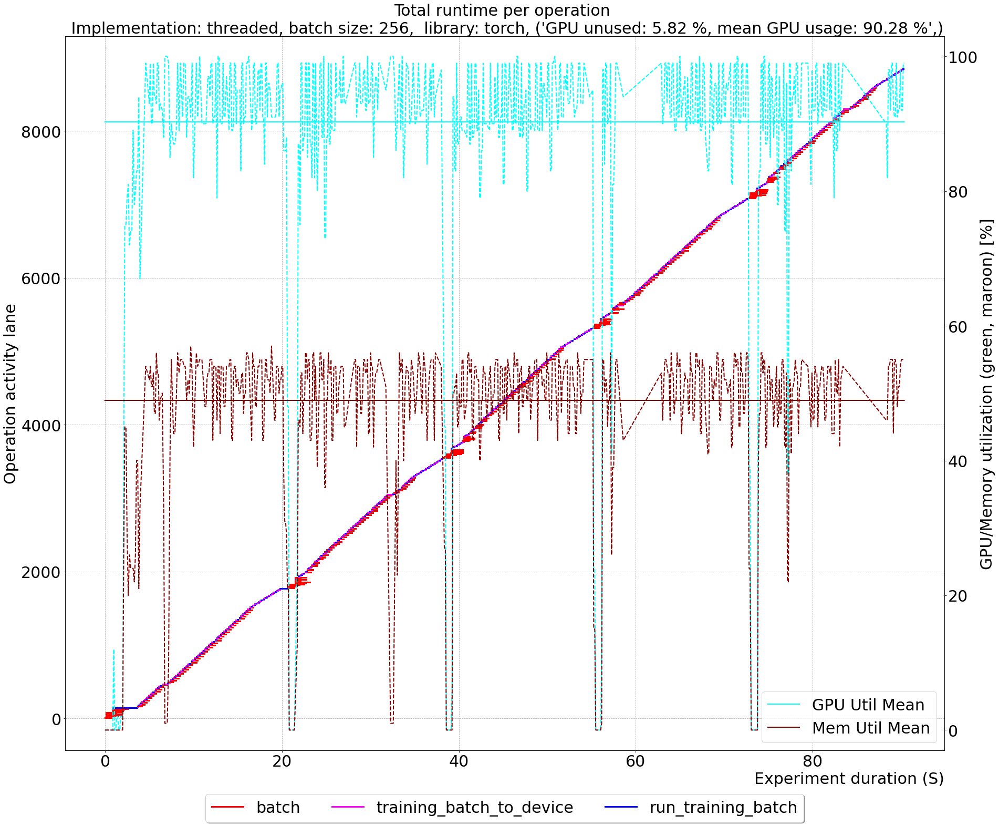

,item_x,id,start_time_x,item_y,end_time_y,source_file,run,duration_td
13,training_batch_to_device,9.547363e+17,1.645195e+09,training_batch_to_device,1.645195e+09,/iarai/home/ivan.svogor/storage-benchmarking/b...,20220218f153617_benchmark_e2e_torch_scratch_25...,0.040000
15,training_batch_to_device,5.129499e+18,1.645195e+09,training_batch_to_device,1.645195e+09,/iarai/home/ivan.svogor/storage-benchmarking/b...,20220218f153617_benchmark_e2e_torch_scratch_25...,0.073925
18,training_batch_to_device,5.070674e+17,1.645195e+09,training_batch_to_device,1.645195e+09,/iarai/home/ivan.svogor/storage-benchmarking/b...,20220218f153617_benchmark_e2e_torch_scratch_25...,0.153372
22,training_batch_to_device,4.492479e+18,1.645195e+09,training_batch_to_device,1.645195e+09,/iarai/home/ivan.svogor/storage-benchmarking/b...,20220218f153617_benchmark_e2e_torch_scratch_25...,0.176114
25,training_batch_to_device,2.567120e+18,1.645195e+09,training_batch_to_device,1.645195e+09,/iarai/home/ivan.svogor/storage-benchmarking/b...,20220218f153617_benchmark_e2e_torch_scratch_25...,0.162455
...,...,...,...,...,...,...,...,...
875,training_batch_to_device,8.202315e+18,1.645195e+09,training_batch_to_device,1.645195e+09,/iarai/home/ivan.svogor/storage-benchmarking/b...,20220218f153617_benchmark_e2e_torch_scratch_25...,0.172587
877,training_batch_to_device,1.853901e+18,1.645195e+09,training_batch_to_device,1.645195e+09,/iarai/home/ivan.svogor/storage-benchmarking/b...,20220218f153617_benchmark_e2e_torch_scratch_25...,0.170676
879,training_batch_to_device,3.889376e+18,1.645195e+09,training_batch_to_device,1.645195e+09,/iarai/home/ivan.svogor/storage-benchmarking/b...,20220218f153617_benchmark_e2e_torch_scratch_25...,0.184254
881,training_batch_to_device,5.117790e+18,1.645195e+09,training_batch_to_device,1.645195e+09,/iarai/home/ivan.svogor/storage-benchmarking/b...,20220218f153617_benchmark_e2e_torch_scratch_25...,0.184566


{'runtime': 90.29549956321716,
 'gpu_util_zero': 5.818619582664526,
 'gpu_util_mean_no_zeros': 90.28078397954836,
 'mem_util_mean': 45.53972712680578,
 'mem_util_mean_no_zeros': 48.9370418283743,
 'implementation': 'threaded',
 'cache': '1',
 'library': 'torch',
 'fig': <Figure size 2160x1800 with 2 Axes>,
 'duration_tr': 26.074349641799927,
 'duration_b': 189.9738199710846,
 'duration_td': 47.51799464225769}

26.074349641799927
189.9738199710846
47.51799464225769


In [31]:
unique_runs_scratch, unique_functions, colors, lanes = get_colors_runs_and_lanes(df_dataloader_scratch)
print(unique_functions)
pd.set_option('display.max_rows', 20)

rs = []

for run in sorted(unique_runs_scratch):
    if "torch" in run:
        df = df_dataloader_scratch[df_dataloader_scratch["run"]==run]
        dfgpu = df_gpuutil_scratch[df_gpuutil_scratch["run"]==run]
        df = df.drop_duplicates(subset="id", keep="first", inplace=False)
        result = show_timelines_with_gpu(df=df, gpu_util=dfgpu, lanes=lanes, colors=colors, run=run, 
                                         flat=False, show_gpu=True, zoom=False, zoom_epochs=2,
                                         skip_plot=False, ms=True)
        df = df_dataloader_scratch[(df_dataloader_scratch["item_x"]=="run_training_batch") & (df_dataloader_scratch["run"]==run)].drop_duplicates(subset=['id'], keep="first", inplace=False) 
        df["duration_tr"] = df["end_time_y"] - df["start_time_x"]
        result["duration_tr"] = (df["end_time_y"] - df["start_time_x"]).sum()
        
        df = df_dataloader_scratch[(df_dataloader_scratch["item_x"]=="batch") & (df_dataloader_scratch["run"]==run)].drop_duplicates(subset=['id'], keep="first", inplace=False) 
        df["duration_b"] = df["end_time_y"] - df["start_time_x"]
        result["duration_b"] = (df["end_time_y"] - df["start_time_x"]).sum()
        
        df = df_dataloader_scratch[(df_dataloader_scratch["item_x"]=="training_batch_to_device") & (df_dataloader_scratch["run"]==run)].drop_duplicates(subset=['id'], keep="first", inplace=False) 
        df["duration_td"] = df["end_time_y"] - df["start_time_x"]
        result["duration_td"] = (df["end_time_y"] - df["start_time_x"]).sum()
    #     result["run"]=run
    #     rs.append(result)
        current_df = df[df["run"]==run]
        display(current_df)
        display(result)
        print(result["duration_tr"].sum())
        print(result["duration_b"].sum())
        print(result["duration_td"].sum())
        break